# Image GANs for Generating Dogs 
We've been learning about AI-generated images in our module on Vision, Images, and Art. Many computer-generated images, like deep fake videos, leverage something called Generative Adversarial Netowrks (GANs). In this homework, we explore using existing GANs libraries for image generation!

Here you will be using a generative adversarial network trained on [ImageNet](http://www.image-net.org/), which we've discussed in lecture previously. Although there are many non-dog classes in ImageNet, we will be focusing our experiments on dog photos. A high quality GAN is tricky to design well and takes dozens of hours or days to train, so to save ourselves computation time, we are using a pre-trained GAN with [TensorFlow](https://www.tensorflow.org/).

This activity is largely to familiarize yourself with some of what GANs are capable of doing, experience existing GAN libraries, and practice picking up some new python modules on your own.

# Part 1: Setup (8% effort)
Your goal for this setup part is simply to successfully run all the code below. This can be frustratingly difficult to setup in Jupyter notebook, so **use Google Colab** for this assignment. Give yourself some credit if you manage to get the modules up and working!

This assignment requires a little funky module installation. Remember: the course discussion forum and Student Help Hours are your friend if you hit installation errors, don’t suffer alone!

**HIGHLY** recommend you read the Set-up instructions detailed in the GitHub README for this Notebook!

### Module Install

This code uses TensorFlow version **1.15** and Python 3, along with a few other modules. We'll need to force Google Colab to use them by installing them first:



In [2]:
# Check that we're running Python older (i.e., less than) 3.8:
import sys
print("\nPYTHON VERSION:", sys.version, " --> Must be less than 3.8!") 

!pip install scikit-image
#!pip install tensorflow==1.15

!pip install tensorflow_hub
!pip install opencv-python

import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
# Using TensorFlow v2 that's compatible with v1

#import tensorflow as tf
print("\nTENSORFLOW VERSION:", tf.__version__, " --> Must be less than 2!")
# You might need to restart your runtime to ensure Colab is using the correct version


PYTHON VERSION: 3.8.16 (default, Dec  7 2022, 01:12:13) 
[GCC 7.5.0]  --> Must be less than 3.8!
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Instructions for updating:
non-resource variables are not supported in the long term



TENSORFLOW VERSION: 2.9.2  --> Must be less than 2!


If your run-time expires, you may need to re-run this cell to ensure you're using the correct version of TensorFlow!

### Environment Setup 

Now we'll import what we need from the modules we've installed.

_Hint_: If you're getting errors on the cell below, you're missing modules! Take notes of which ones you need to install, close this notebook, and view the Github README for set-up instructions!

In [3]:
from io import BytesIO
import IPython.display
import numpy as np
import urllib
import PIL.Image
from scipy.stats import truncnorm
from skimage import io, data, transform 
import requests
import tensorflow as tf # pip install tensorflow==1.15
from tensorflow.python.framework import ops
import tensorflow_hub as hub #pip install tensorflow_hub
import scipy.misc
from tqdm import tqdm
import random
import cv2 # pip install opencv-python
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()


### BigGAN Model Setup

For this exercise, we will use a pre-trained model called _BigGAN_ generator available on [TensorFlow Hub](https://tfhub.dev/deepmind/biggan-128/2). For more information about this model, check out the authors' paper [_"Large Scale GAN Training for High Fidelity Natural Image Synthesis"_ Brock et al. 2019](https://arxiv.org/abs/1809.11096). Next is the address to download this model from TensorFlow Hub:

In [4]:
# this model will output 128 by 128 pixel images.
module_path = 'https://tfhub.dev/deepmind/biggan-512/2'
##'https://tfhub.dev/deepmind/biggan-128/2'  ## normal resolution
##'https://tfhub.dev/deepmind/biggan-512/2'   ##higher resolution, can't use it for everything because i get the runtime disconnected
                                              #error when trying to generate grid with it
print(module_path)

https://tfhub.dev/deepmind/biggan-512/2


### Helper Code Setup

This code below is adapted from the [BigGANs Tutorial](https://colab.research.google.com/drive/1rqDwIddy0eunhhV8yrznG4SNiB5XWFJJ) from [Machine Learning for Artists](https://ml4a.github.io/) by Gene Kogan. Many of the exercises here are inspired from that tutorial, so check it out if you want to have more fun with GANs later!

In [5]:
''' Better code design would dictate placing this code in 'helpers.py' and then importing the file, 
    but to make our GOOGLE COLAB life easier, I've included the helper code in this cell below.
    This makes it so we can run this notebook without uploading *any* external files!
    There is no need for you to try and understand what this cell block is doing! 
    Just run it so you can use the helper.py utilities.
'''
"""
Helper code from the BigGAN tutorial: https://colab.research.google.com/drive/1rqDwIddy0eunhhV8yrznG4SNiB5XWFJJ

Adapted for Human-AI Interaction class.

"""

from io import BytesIO
import IPython.display
import numpy as np
import urllib
import PIL.Image
from scipy.stats import truncnorm
from skimage import io, data, transform  # pip install scikit-image
import requests
import tensorflow as tf  # pip install tensorflow==1.15
from tensorflow.python.framework import ops
import tensorflow_hub as hub
import scipy.misc
from tqdm import tqdm
#from random import random
import cv2  # pip install opencv-python
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

class GANSession:
    def __init__(self, module_path):
        ops.reset_default_graph()
        print('Loading BigGAN module from:', module_path)
        self.module = hub.Module(module_path)
        self.inputs = {k: tf.placeholder(v.dtype, v.get_shape().as_list(), k)
                       for k, v in self.module.get_input_info_dict().items()}
        self.output = self.module(self.inputs)

        print("\n")
        print('Inputs:\n', '\n'.join('  {}: {}'.format(*kv)
                                     for kv in self.inputs.items()))
        print("\n")
        print('Output:', self.output)

        self.input_z = self.inputs['z']
        self.input_y = self.inputs['y']
        self.input_trunc = self.inputs['truncation']

        self.dim_z = self.input_z.shape.as_list()[1]
        self.vocab_size = self.input_y.shape.as_list()[1]

        # Create a TensorFlow session and initialize variables
        initializer = tf.global_variables_initializer()
        self.sess = tf.Session()
        self.sess.run(initializer)

    def truncated_z_sample(self, batch_size, truncation=1., seed=None):
        state = None if seed is None else np.random.RandomState(seed)
        values = truncnorm.rvs(-2, 2, size=(batch_size,
                                            self.dim_z), random_state=state)
        return truncation * values

    def one_hot(self, index, vocab_size=None):
        if(not vocab_size):
            vocab_size = self.vocab_size
        index = np.asarray(index)
        if len(index.shape) == 0:
            index = np.asarray([index])
        assert len(index.shape) == 1
        num = index.shape[0]
        output = np.zeros((num, vocab_size), dtype=np.float32)
        output[np.arange(num), index] = 1
        return output

    def one_hot_if_needed(self, label, vocab_size=None):
        if(not vocab_size):
            vocab_size = self.vocab_size
        label = np.asarray(label)
        if len(label.shape) <= 1:
            label = self.one_hot(label, vocab_size)
        assert len(label.shape) == 2
        return label

    def sample(self, noise, label, truncation=1., batch_size=8, vocab_size=None):
        sess = self.sess
        if(not vocab_size):
            vocab_size = self.vocab_size
        noise = np.asarray(noise)
        label = np.asarray(label)
        num = noise.shape[0]
        if len(label.shape) == 0:
            label = np.asarray([label] * num)
        if label.shape[0] != num:
            raise ValueError('Got # noise samples ({}) != # label samples ({})'
                             .format(noise.shape[0], label.shape[0]))
        label = self.one_hot_if_needed(label, vocab_size)
        ims = []
        for batch_start in tqdm(range(0, num, batch_size)):
            s = slice(batch_start, min(num, batch_start + batch_size))
            feed_dict = {self.input_z: noise[s],
                         self.input_y: label[s], self.input_trunc: truncation}
            ims.append(sess.run(self.output, feed_dict=feed_dict))
        ims = np.concatenate(ims, axis=0)
        assert ims.shape[0] == num
        ims = np.clip(((ims + 1) / 2.0) * 256, 0, 255)
        ims = np.uint8(ims)
        return ims

    def interpolate(self, A, B, num_interps):
        alphas = np.linspace(0, 1, num_interps)
        if A.shape != B.shape:
            raise ValueError(
                'A and B must have the same shape to interpolate.')
        return np.array([(1-a)*A + a*B for a in alphas])

    def imgrid(self, imarray, cols=5, pad=1):
        if imarray.dtype != np.uint8:
            raise ValueError('imgrid input imarray must be uint8')
        pad = int(pad)
        assert pad >= 0
        cols = int(cols)
        assert cols >= 1
        N, H, W, C = imarray.shape
        rows = int(np.ceil(N / float(cols)))
        batch_pad = rows * cols - N
        assert batch_pad >= 0
        post_pad = [batch_pad, pad, pad, 0]
        pad_arg = [[0, p] for p in post_pad]
        imarray = np.pad(imarray, pad_arg, 'constant', constant_values=255)
        H += pad
        W += pad
        grid = (imarray
                .reshape(rows, cols, H, W, C)
                .transpose(0, 2, 1, 3, 4)
                .reshape(rows*H, cols*W, C))
        if pad:
            grid = grid[:-pad, :-pad]
        return grid

    def interpolate_and_shape(self, A, B, num_samples, num_interps):
        interps = self.interpolate(A, B, num_interps)
        return (interps.transpose(1, 0, *range(2, len(interps.shape)))
                .reshape(num_samples * num_interps, -1))

    def get_interpolated_yz(self, categories_all, num_interps, noise_seed_A, noise_seed_B, truncation):
        nt = len(categories_all)
        num_samples = 1
        z_A, z_B = [self.truncated_z_sample(num_samples, truncation, noise_seed)
                    for noise_seed in [noise_seed_A, noise_seed_B]]
        y_interps = []
        for i in range(nt):
            category_A, category_B = categories_all[i], categories_all[(
                i+1) % nt]
            y_A, y_B = [self.one_hot([category] * num_samples)
                        for category in [category_A, category_B]]
            y_interp = self.interpolate_and_shape(
                np.array(y_A), np.array(y_B), num_samples, num_interps)
            y_interps.append(y_interp)
        y_interp = np.vstack(y_interps)
        z_interp = self.interpolate_and_shape(
            z_A, z_B, num_samples, num_interps * nt)

        return y_interp, z_interp

    def get_transition_yz(self, classes, num_interps, truncation):
        noise_seed_A, noise_seed_B = 10, 20   # fix this!
        return self.get_interpolated_yz(classes, num_interps, noise_seed_A, noise_seed_B, truncation=truncation)

    def get_random_yz(self, num_classes, num_interps, truncation):
        random_classes = [int(1000*random()) for i in range(num_classes)]
        return self.get_transition_yz(random_classes, num_interps, truncation=truncation)

    def get_combination_yz(self, categories, noise_seed, truncation):
        z = np.vstack([self.truncated_z_sample(1, truncation, noise_seed)]
                      * (len(categories)+1))
        y = np.zeros((len(categories)+1, 1000))
        for i, c in enumerate(categories):
            y[i, c] = 1.0
            y[len(categories), c] = 1.0
        return y, z

    def slerp(self, A, B, num_interps):  # see https://en.wikipedia.org/wiki/Slerp
        # each unit step tends to be a 90 degree rotation in high-D space, so this is ~360 degrees
        alphas = np.linspace(-1.5, 2.5, num_interps)
        omega = np.zeros((A.shape[0], 1))
        for i in range(A.shape[0]):
            tmp = np.dot(A[i], B[i]) / \
                (np.linalg.norm(A[i])*np.linalg.norm(B[i]))
            omega[i] = np.arccos(np.clip(tmp, 0.0, 1.0))+1e-9
        return np.array([(np.sin((1-a)*omega)/np.sin(omega))*A + (np.sin(a*omega)/np.sin(omega))*B for a in alphas])

    def slerp_and_shape(self, A, B, num_interps):
        interps = self.slerp(A, B, num_interps)
        return (interps.transpose(1, 0, *range(2, len(interps.shape)))
                .reshape(num_interps, *interps.shape[2:]))

    def imshow(self, a, format='png', jpeg_fallback=True):
        a = np.asarray(a, dtype=np.uint8)
        str_file = BytesIO()
        PIL.Image.fromarray(a).save(str_file, format)
        png_data = str_file.getvalue()
        try:
            disp = IPython.display.display(IPython.display.Image(png_data))
        except IOError:
            if jpeg_fallback and format != 'jpeg':
                print ('Warning: image was too large to display in format "{}"; '
                       'trying jpeg instead.').format(format)
                return self.imshow(a, format='jpeg')
            else:
                raise
        return disp
    
# You can safely ignore the tensorflow WARNING outputs
gan = GANSession(module_path)
print("This cell takes Colab 1-5 mins).")

Loading BigGAN module from: https://tfhub.dev/deepmind/biggan-512/2


Inputs:
   z: Tensor("z:0", shape=(?, 128), dtype=float32)
  y: Tensor("y:0", shape=(?, 1000), dtype=float32)
  truncation: Tensor("truncation:0", shape=(), dtype=float32)


Output: Tensor("module_apply_default/G_trunc_output:0", shape=(?, 512, 512, 3), dtype=float32)
This cell takes Colab 1-5 mins).


## Part 2: Experimenting with generating deep fake puppies

### Task 2.A (2% effort) Choose a dog breed from `dog_classes.txt`, replacing the "263...'corgi" below.

truncation:  0.6 noise seed: 50


100%|██████████| 1/1 [00:08<00:00,  8.97s/it]


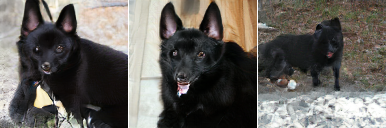

In [6]:
## Task 2.A: 
import random
truncation = 0.6 #random.uniform(0.02,1) # min:0.02, max:1
noise_seed = 50 # random.randint(0,100) # min:0, max:100
category = "223: 'schipperke'" # put dog breed here
# 179: 'Staffordshire bullterrier, Staffordshire bull terrier'
#original one : "263: 'Pembroke, Pembroke Welsh corgi'"

num_samples = 3 # Number of images to generate with these parameters

# returns an ndarray, each item is another ndarray is used to generate the images
z = gan.truncated_z_sample(num_samples, truncation, noise_seed) 
y = int(category.split(':')[0])

print('truncation: ',truncation, 'noise seed:',noise_seed)

ims = gan.sample(z, y, truncation=truncation) # ims is a numpy array
max_columns = 20
gan.imshow(gan.imgrid(ims, cols=min(num_samples, max_columns)))

### Task 2.B (7% effort) Initial Explorations
Run the above image generator cell several times. Experiment! Find your best looking result and place the code in the cell block below. Find your worst looking result, and place it in the cell block after the best one. Be sure to run the cells again, so the images are generated! 

Describe what you are seeing: what kinds of visual errors do you think this model is creating? 

**ANSWER:** _Double click this text to write your answer to the question here._

truncation:  0.8724691094286717 noise seed: 16


100%|██████████| 1/1 [00:00<00:00, 17.04it/s]


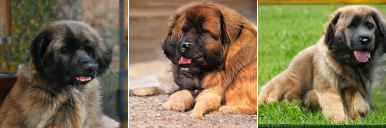

In [7]:
# BEST LOOKING RESULT (code):

import random
truncation = 0.8724691094286717 #random.uniform(0.02,1) # min:0.02, max:1
noise_seed = 16 # random.randint(0,100) # min:0, max:100
category = "255: 'Leonberg'" # put dog breed here
# 179: 'Staffordshire bullterrier, Staffordshire bull terrier'
#original one : "263: 'Pembroke, Pembroke Welsh corgi'"

num_samples = 3 # Number of images to generate with these parameters

# returns an ndarray, each item is another ndarray is used to generate the images
z = gan.truncated_z_sample(num_samples, truncation, noise_seed) 
y = int(category.split(':')[0])

print('truncation: ',truncation, 'noise seed:',noise_seed)

ims = gan.sample(z, y, truncation=truncation) # ims is a numpy array
max_columns = 20
gan.imshow(gan.imgrid(ims, cols=min(num_samples, max_columns)))

truncation:  0.5 noise seed: 80


100%|██████████| 1/1 [00:00<00:00, 16.93it/s]


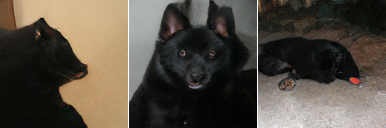

In [8]:
# WORST LOOKING RESULT (code): 

#this dog looks demonic, the first one looks like a black pig

import random
truncation = 0.5 
noise_seed = 80 
category = "223: 'schipperke'" 
num_samples = 3 # Number of images to generate with these parameters

# returns an ndarray, each item is another ndarray is used to generate the images
z = gan.truncated_z_sample(num_samples, truncation, noise_seed) 
y = int(category.split(':')[0])

print('truncation: ',truncation, 'noise seed:',noise_seed)

ims = gan.sample(z, y, truncation=truncation) # ims is a numpy array
max_columns = 20
gan.imshow(gan.imgrid(ims, cols=min(num_samples, max_columns)))

### Task 2.C (7% effort) Generate a row of dogs with different noise_seeds
The code below generates two images with the same `truncation` value, but with two different `noise_seed`s. Adapt this code so that it generates a row of 11 dog images, where each dog has a different value of the parameter `noise_seed` evenly distributed across the range 0 to 100 inclusive (i.e., 0, 10, 20, ...100).

For a Welsh Pembroke Corgi with a fixed `truncation` value of `0.95` this looks like the file included in the [Github repository:_`2c_corgi-noise-seeds.png`](https://github.com/UberHowley/haii-a5/blob/main/2c_corgi-noise-seeds.png) where the leftmost Corgi has a `noise_seed` of `0` and the rightmost has a `noise_seed` of 100.

100%|██████████| 2/2 [00:01<00:00,  1.09it/s]


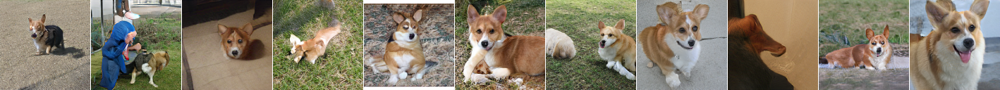

In [9]:
# WORST LOOKING RESULT (code): 


## Task 2.A: Modify this code!
import random
from numpy import *
import numpy as np
truncation = 0.95 
noise_seed = 0 
category = "263: 'Pembroke, Pembroke Welsh corgi'"

num_samples = 1 # Number of images to generate with these parameters

# returns an ndarray, each item is another ndarray is used to generate the images
z = gan.truncated_z_sample(num_samples, truncation, noise_seed)

#adding elements with different noise seed values to array 
for i in range(10):
  noise_seed += 10
  z = np.concatenate((z, gan.truncated_z_sample(num_samples, truncation, noise_seed)))
  
y = int(category.split(':')[0])

ims = gan.sample(z, y, truncation=truncation) # ims is a numpy array
max_columns = 20
gan.imshow(gan.imgrid(ims, cols=min(len(z), max_columns)))


### Task 2.D (12% effort) Generate a grid of dogs, varying noise_seed and truncation
Take the code from 2.C above and copy that below. Now, your target output is a _grid_ of dogs. Just as before in 2.C, each _row_ will be 11 generated dogs in an ordered range by `noise_seed` 0-100. Now the _columns_ of the grid shall be different values of the `truncation` parameter, in an ordered range from 0.02-1.0. Your finished grid should have 11 rows, 11 columns, where the top left dog in the grid has a `noise_seed = 0` and `truncation = 0.02` and the values of those parameters increase top to bottom left to right. The dog at the bottom right will have a `noise_seed = 100` and `truncation = 1.0`.

If you're unsure if you've got the right grid, you can see what it should look like for corgis in the [Github repository:_`2d_corgi-dog-grid.png`](https://github.com/UberHowley/haii-a5/blob/main/2d_corgi-dog-grid.png) .

100%|██████████| 16/16 [00:05<00:00,  3.00it/s]


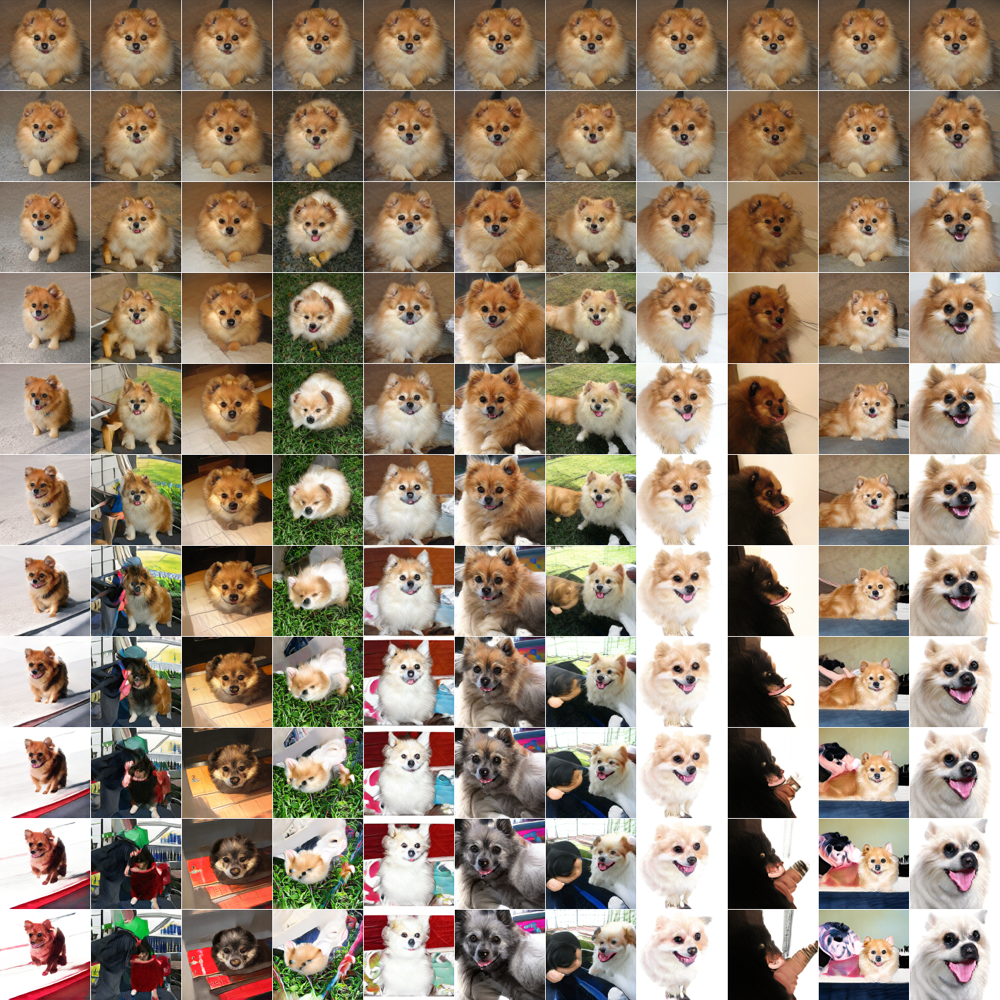

In [17]:
## Task 2.D: 

import random
from numpy import *
import numpy as np
truncation = 0.02 #random.uniform(0.02,1) # min:0.02, max:1
noise_seed = 0 #random.randint(0,100) # min:0, max:100
category =  "259: 'Pomeranian'" # put dog breed here
# 179: 'Staffordshire bullterrier, Staffordshire bull terrier'
#original one : "263: 'Pembroke, Pembroke Welsh corgi'"

num_samples = 11 # Number of images to generate with these parameters

# returns an ndarray, each item is another ndarray is used to generate the images
#just initialzing the numpy array because I ran into problems when trying to initialize it as an array
z = gan.truncated_z_sample(0, truncation, noise_seed)
  
y = int(category.split(':')[0])

#function that increments the value for the noise seed 
# then adds a row of the different values for noise seed for the same value of truncation 
def addSeeds(noise_seedd, truncations):
  b=[]
  a = gan.truncated_z_sample(1, truncations, noise_seedd)
  for i in range(10):
   noise_seedd += 10
   a = np.concatenate((a, gan.truncated_z_sample(1, truncations, noise_seedd)))  
  b=a 
  a=[]
  return b


for i in range(11):
  #adding 10 samples for each one of our values for truncation while incrementing it each time
  z = np.concatenate((z, addSeeds(0, truncation)))
  truncation += 0.089

y = int(category.split(':')[0])
truncation = 0.02
max_columns = 20
ims = gan.sample(z, y, truncation = truncation) # ims is a numpy array
gan.imshow(gan.imgrid(ims, cols=11))

### Task 2.E (12% effort) Hypothesize the relationship between noise_seed and truncation. 


**ANSWER:** 
Given your experimentations above and your grid of dogs, hypothesize:
 - What might be the relationship between `noise_seed` and what a generated dog looks like?
  - noise seed seems to be actually changing the content of the image more than truncation. It changes the positions, angles and elements of the picture so I think it is the one responsible for changing the fundamental features of the image generated without diverting too much from the original image. (most of the time)

 - What might be the relationship between `truncation` and what a generated dog looks like?
  - Truncation causes a certain type of visual distortion in the images of the dogs generated, although they do look similar. In the middle rows, the images looks more "real" so truncation might have a set value that generates the original image the model was trained on, and the more you divert from it, the less the images being generated resemble that original picture

# Part 3: Experimenting with transforming puppies

In this section, we will experiment with different forms of interpolation to transform and combine different dog images.

### Task 3.A (10% effort) Compare truncation and noise_seed across breeds
Modify and run the code below, putting in your favorite `truncation` and `noise_seed` values from your experiments in Part 2. Run the code with a pair of closely similar breeds (similar to the Pembroke and the Cardigan Welsh corgies shown below) and a pair of very different breeds. 
 - What do you hypothesize this code is doing with the two dog image samples? Where is `noise_seed_A`'s impact appearing? What about `noise_seed_B`? What is being `interpolated`?
 - Hypothesize: Does the performance (visual quality of the output) differ based on qualities of the source images such as similar dog breed or similar image background?

**ANSWER:**

What do you hypothesize this code is doing with the two dog image samples? Where is noise_seed_A's impact appearing? What about noise_seed_B? What is being interpolated?
- I think that the code generates images between the image A which is the dog from category A with noise seed A, and image B which is the dog from category B with noise seed B. It starts with image A and starts distorting it into image B. From what it seems, the final generated image resembles more the image with a higher noise seed.


Hypothesize: Does the performance (visual quality of the output) differ based on qualities of the source images such as similar dog breed or similar image background?
- the final image looks better when the two dogs are of similar breeds and/or when they're in the same position/image taken from same angle. 

100%|██████████| 3/3 [00:01<00:00,  1.83it/s]


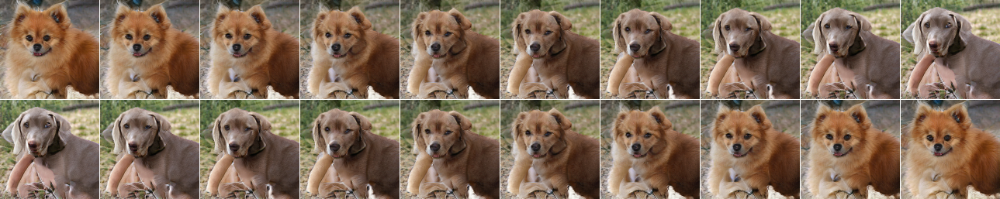

In [11]:
## Task 3.A: Modify this code!
num_interps = 10 # min:2, max:1000
truncation = 0.6 # min:0.02, max:1
noise_seed_A = 50 # min:0, max:100
category_A = "259: 'Pomeranian'" 
noise_seed_B = 50 # min:0, max:100
category_B = " 178: 'Weimaraner'" 

y_interp, z_interp = gan.get_interpolated_yz([int(category_A.split(':')[0]), int(category_B.split(':')[0])], num_interps, noise_seed_A, noise_seed_B, truncation=truncation)
imgs = gan.sample(z_interp, y_interp, truncation=truncation)
gan.imshow(gan.imgrid(imgs, cols=num_interps))

### Task 3.B (8% effort) Different truncations for different dalmations
The code below does a different, but similar operation to the code in Task 3.A.

Modify and run the code below, putting in your favorite `truncation` and `noise_seed` values from your experiments in Part 2. Run the code with a pair of closely similar breeds (similar to the Pembroke and the Cardigan Welsh corgies shown below) and a pair of very different breeds. 
 - What do you hypothesize this code is doing with the two dog image samples?
 - Hypothesize: Does the performance (visual quality of the output) differ based on qualities of the source images such as similar dog breed or similar image background?
 - Unlike in Task 3.A, both images share the same `noise_seed`. From your observations, what do you think is the effect of having the images share the same parameter value versus having each their own `noise_seed`?
 - What might be the difference between `interpolated` and `combination`?

**ANSWER:** 

- *What do you hypothesize this code is doing with the two dog image samples?*
  - the code takes two images, extracts features from both dogs and combines them into one dog
  
- *Hypothesize: Does the performance (visual quality of the output) differ based on qualities of the source images such as similar dog breed or similar image background?*
  - the final image quality does not change drasically when changing the source images (especially that both images have the same noise seed), the main change that I can see is how realistic the dog looks in the final image (similar breeds generate more realistic dogs because the features combined are similar, and vice versa)

- *Unlike in Task 3.A, both images share the same noise_seed. From your observations, what do you think is the effect of having the images share the same parameter value versus having each their own noise_seed?*
  - the dogs in both images are in the same position, and so is the dog in the final image 
  - the final image seems to combine features from both images more equally than when we had different noise seeds


- *what might be the difference between interpolated and combination?*
  - interpolated = you can see the transition and it's more seamless and smooth. Also, controlling the two noise seeds can gives you the option to choose which dog should the final image resemble more, and sometimes it's hard to tell what the other non-dominant breed is.
  - combination : the transition is not as seamless: In most cases, you can still guess the breed of the two source dogs.

  -> the interpolation process seems to be more transition focused, it finds multiple images between the two sources images and progressively merges them. while the combination process seems to almost like the outcome of one equation:
 
    x percentage of features from dog 1 ➕ y percentage of features from dog 2 = final image

100%|██████████| 1/1 [00:00<00:00,  3.39it/s]


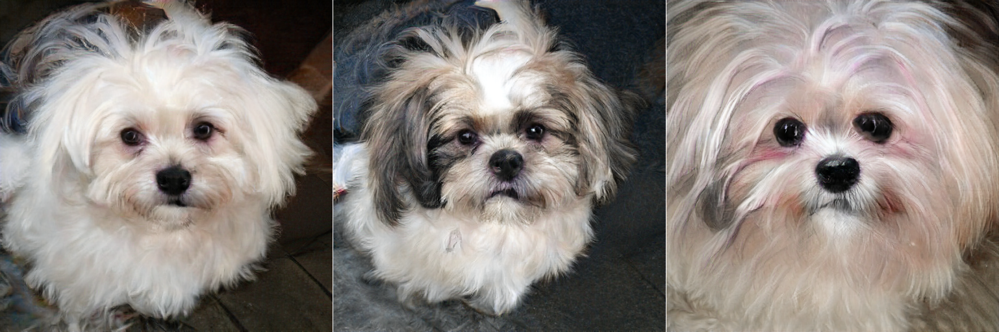

In [56]:
## Task 3.B: 
truncation = 0.3 # min:0.02, max:1
noise_seed = 50 # min:0, max:100
categoryA = " 153: 'Maltese dog, Maltese terrier, Maltese'" 
categoryB = " 155: 'Shih-Tzu'" 

categories = [int(categoryA.split(':')[0]), int(categoryB.split(':')[0])]
y, z = gan.get_combination_yz(categories, noise_seed, truncation)
imgs = gan.sample(z, y, truncation=truncation)
gan.imshow(gan.imgrid(imgs, cols=len(categories)+1))

### Task 3.C (5% effort) Generate your best looking result. 
Run the above cell several times. Experiment! Find your best looking result and place the code in the cell block below. Be sure to run the cell again, so the images are generated.

100%|██████████| 1/1 [00:00<00:00, 13.03it/s]


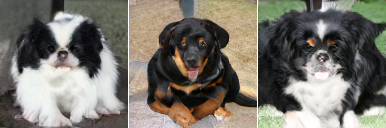

In [44]:
# BEST LOOKING RESULT (code):

truncation = 0.02 # min:0.02, max:1
noise_seed = 50 # min:0, max:100

# I like this resuslt: a little black and white dog with golden eyebrows
categoryA = " 152: 'Japanese spaniel'" 
categoryB = " 234: 'Rottweiler'" 


#other good results :
#categoryA = " 152: 'Japanese spaniel'" 
#categoryB = "  233: 'Bouvier des Flandres, Bouviers des Flandres'" 

#categoryA = " 177: 'Scottish deerhound, deerhound'" 
#categoryB = " 187: 'Yorkshire terrier'" 
categories = [int(categoryA.split(':')[0]), int(categoryB.split(':')[0])]
y, z = gan.get_combination_yz(categories, noise_seed, truncation)
imgs = gan.sample(z, y, truncation=truncation)
gan.imshow(gan.imgrid(imgs, cols=len(categories)+1))

### Task 3.D (5% effort) reallyBigGANs
A big advantage of the BigGAN model over other GANs is that it is able to produce much higher resolution images than GANs were previously capable of. To test this out, go up to the BigGAN Model Setup section, and replace the module path with ['https://tfhub.dev/deepmind/biggan-512/2']('https://tfhub.dev/deepmind/biggan-512/2'). Then re-run just the `BigGAN Model Setup` and `Helper Code Setup` sub-sections of this notebook. This will load a version of BigGAN that can generate 512 by 512 pixel images instead of 128 by 128 pixels.

Now re-run the code for Task 3.B in some exploratory experiments, and store the code that generates your best looking result in the code cell below. Be sure to. run the cell so that the image is generated. _Note: since this generates a larger image, it will take longer to compute _

100%|██████████| 1/1 [00:11<00:00, 11.56s/it]


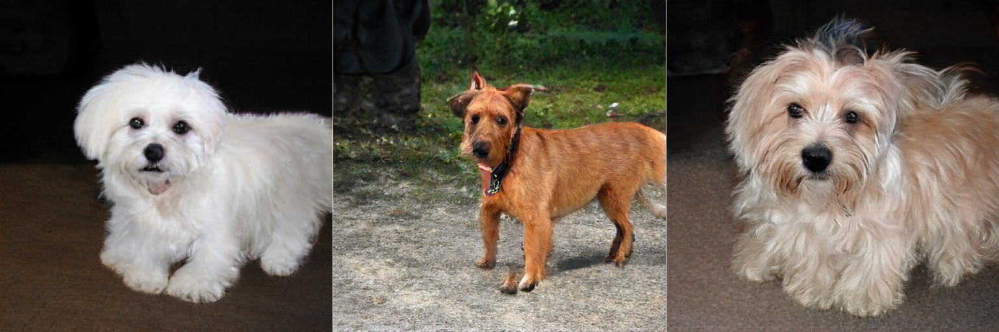

In [7]:
# BEST LOOKING RESULT (code):

##golden maltese ?

truncation = 0.4 # min:0.02, max:1
noise_seed = 22 # min:0, max:100
categoryA = " 153: 'Maltese dog, Maltese terrier, Maltese'" 
categoryB = " 184: 'Irish terrier'" 

categories = [int(categoryA.split(':')[0]), int(categoryB.split(':')[0])]
y, z = gan.get_combination_yz(categories, noise_seed, truncation)
imgs = gan.sample(z, y, truncation=truncation)
gan.imshow(gan.imgrid(imgs, cols=len(categories)+1))

### Task 3.E (5% effort) BigGAN vs not-so-bigGAN
Compare your best results from Task 3.C and 3.D. Hypothesize, what do you think the effect of a higher resolution GAN is on the image quality?

**ANSWER:** 

the high resolution images seem to have more  details (you can especially see it in the dog's coat/fur, even the background is more detailed) and are clearer than the lower resolution ones. 

so maybe high resolution --> more visual details

# Part 4: Beyond Dogs

In this section, we examine our image dataset more closely.

### Task 4.A (1% effort) Compare noise_seed across a new category
ImageNet (where, unfortunately, we get our dog breed images) has many other classes, listed in `imagenet_classes-all.txt`. Choose one of these categories, and explore the impact `noise_seed` has on the output (i.e., see Task 2C).

100%|██████████| 2/2 [00:00<00:00,  9.60it/s]


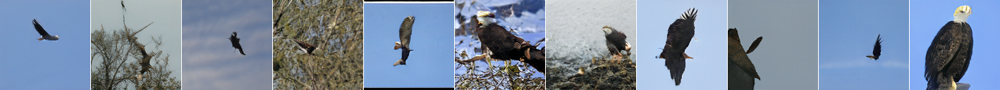

In [23]:
# Task 4.A: Add new code here!
import random
from numpy import *
import numpy as np
truncation = 0.95 #random.uniform(0.02,1) # min:0.02, max:1
noise_seed = 0 #random.randint(0,100) # min:0, max:100
category = " 22: 'bald eagle, American eagle, Haliaeetus leucocephalus'"
#"199: 'Scotch terrier, Scottish terrier, Scottie'" # put dog breed here
# 179: 'Staffordshire bullterrier, Staffordshire bull terrier'
#original one : "263: 'Pembroke, Pembroke Welsh corgi'"

num_samples = 1 # Number of images to generate with these parameters

# returns an ndarray, each item is another ndarray is used to generate the images
z = gan.truncated_z_sample(num_samples, truncation, noise_seed)

#adding elements with different noise seed values to array 
for i in range(10):
  noise_seed += 10
  z = np.concatenate((z, gan.truncated_z_sample(num_samples, truncation, noise_seed)))
  
y = int(category.split(':')[0])

ims = gan.sample(z, y, truncation=truncation) # ims is a numpy array
max_columns = 20
gan.imshow(gan.imgrid(ims, cols=min(len(z), max_columns)))



### Task 4.B (1% effort) Compare truncation and noise_seed across categories
Grab your code from Task 3A and explore how `noise_seed` and `truncation` impact the transition between two different categories.

100%|██████████| 16/16 [00:01<00:00,  9.68it/s]


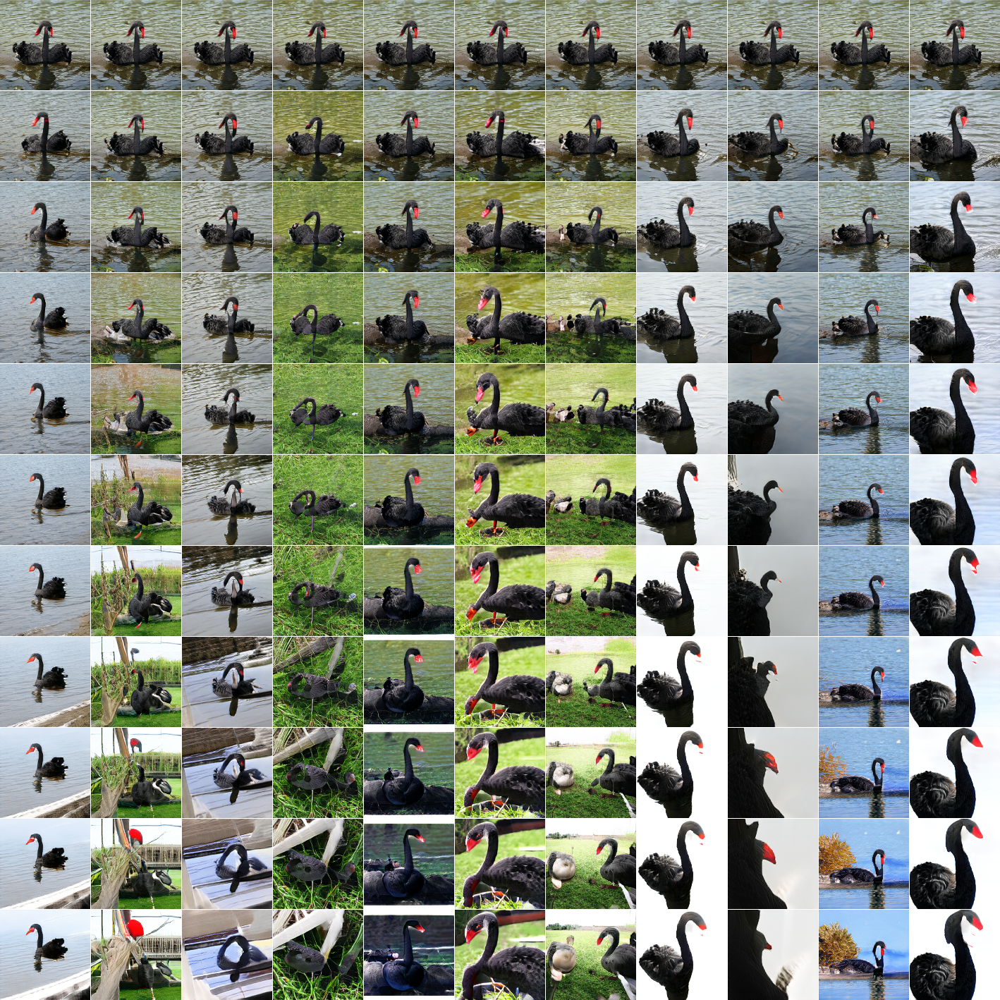

In [20]:

import random
from numpy import *
import numpy as np
truncation = 0.02 #random.uniform(0.02,1) # min:0.02, max:1
noise_seed = 0 #random.randint(0,100) # min:0, max:100
category =  " 100: 'black swan, Cygnus atratus'" 

num_samples = 11 # Number of images to generate with these parameters

# returns an ndarray, each item is another ndarray is used to generate the images
#just initialzing the numpy array because I ran into problems when trying to initialize it as an array
z = gan.truncated_z_sample(0, truncation, noise_seed)
  
y = int(category.split(':')[0])

#function that increments the value for the noise seed 
# then adds a row of the different values for noise seed for the same value of truncation 
def addSeeds(noise_seedd, truncations):
  b=[]
  a = gan.truncated_z_sample(1, truncations, noise_seedd)
  for i in range(10):
   noise_seedd += 10
   a = np.concatenate((a, gan.truncated_z_sample(1, truncations, noise_seedd)))  
  b=a 
  a=[]
  return b


for i in range(11):
  #adding 10 samples for each one of our values for truncation while incrementing it each time
  z = np.concatenate((z, addSeeds(0, truncation)))
  truncation += 0.089

y = int(category.split(':')[0])
truncation = 0.02
max_columns = 20
ims = gan.sample(z, y, truncation = truncation) # ims is a numpy array
gan.imshow(gan.imgrid(ims, cols=11))

### Task 4.C (2% effort) Mad Scientist Time!
Convert your code from Task 3B into a method, `generate_combo`, that lets you easily combine two classes into one. Explore! Experiment! What's happening?!

100%|██████████| 1/1 [00:00<00:00,  3.26it/s]


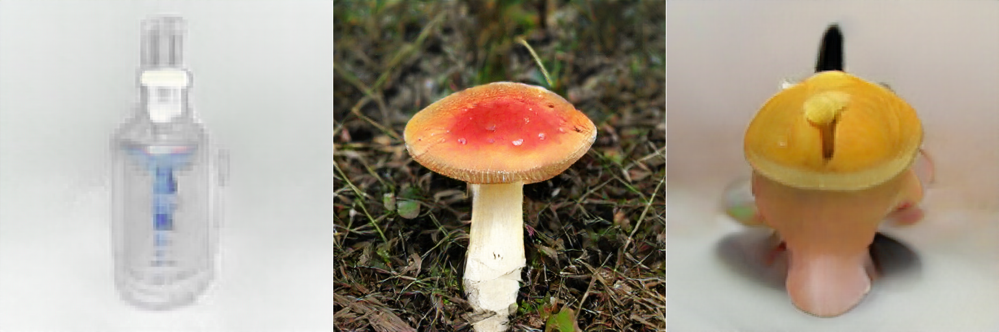

100%|██████████| 1/1 [00:00<00:00,  4.38it/s]


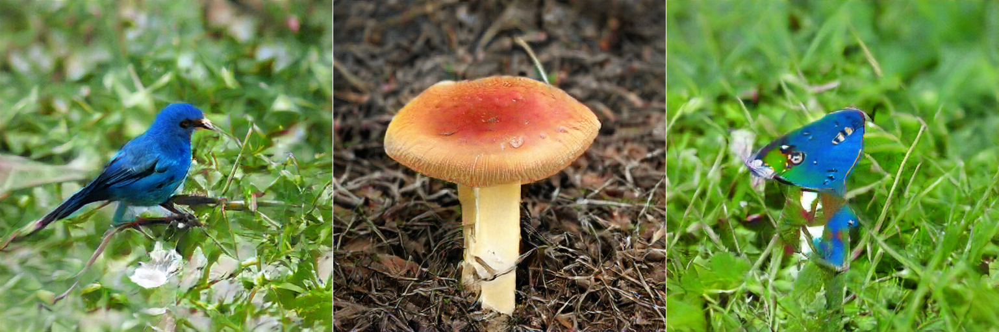

In [17]:
# Task 4.D: Complete code below:


def generate_combo(categoryA, categoryB, noise_seed, truncation):
  categories = [int(categoryA.split(':')[0]), int(categoryB.split(':')[0])]
  y, z = gan.get_combination_yz(categories, noise_seed, truncation)
  imgs = gan.sample(z, y, truncation=truncation)
  gan.imshow(gan.imgrid(imgs, cols=len(categories)+1))  

# Calls to generate_combo below:


generate_combo("680: 'nipple'", " 947: 'mushroom'", 90, 0.2)
#generate_combo("107: 'jellyfish'", " 135: 'limpkin, Aramus pictus'", 50, 0.2) #this looks beautiful 
generate_combo("14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea'", " 947: 'mushroom'", 10, 0.2) #omg butterfly(?) from a bird and a mushroom
#generate_combo("959: 'carbonara'", " 655: 'miniskirt, mini'", 10, 0.2) # this looks yummy
#generate_combo("959: 'carbonara'", "743: 'prison, prison house''", 10, 0.2) # it looks like a meal of frog's eggs (ew?)
#generate_combo("738: 'pot, flowerpot'", "470: 'candle, taper, wax light'", 40, 0.2) # this looks cool
#generate_combo("985: 'daisy'", "470: 'candle, taper, wax light'", 60, 0.2)  # the result looks like an oil painting !

### Task 4.E (5% effort) Imagenet and the Unbearable Weight of Massive Methodological Issues

This is not our first time encountering ImageNet and its multitudinous problems! Can you recall the previous times ImageNet was brought up? 
 - How do the problems discussed in the [Excavating AI](https://excavating.ai/) article intersect with the ImageNet classes in our `imagenet_classes-all.txt` file? 
 - Is it _wrong_ for the ImageNet authors to censor their dataset?
 - What ethical principles does ImageNet support or contradict?
 - Is it okay to use datasets that conflict with our values: privacy, morals, social good, equity, etc.?

**ANSWER:** 



Although many of the problems discussed in the article no longer interset with our imageNet imagenet_classes-all.txt, because it doesn’t contain the category “person” anymore, and labeling datasets that contain people can potentially raise more ethical, bias, and fairness concerns than labeling datasets that contain objects. However, labeling objects still raises some concerns as well. For instance, I noticed that the file sometimes includes different names for certain objects, such as 412: 'ashcan, trash can, garbage can, wastebin, ash bin, ash-bin, ashbin, dustbin, trash barrel, trash bin', 413: 'assault rifle, assault gun'. While it does not for others, such as 665: 'moped', ( who decides that “scooter”, for example, shouldn’t be there ?) and 668: 'mosque' ( if they borrowed the word 399: 'abaya' from arabic to use instead of “cloak”, why not borrow the Arabic word for mosque too, “masjid” ? ). I am reminded of what the article says about how “the whole endeavor of collecting images, categorizing them, and labeling them is itself a form of politics, filled with questions about who gets to decide what images mean and what kinds of social and political work those representations perform.” Also, just in terms of clothes listed in the file, are we representing clothes from different cultures equally in our data set? As far as I can tell from the objects in this file, it is unlikely. So, while ImageNet is taking measures to "fix" its dataset's potential prejudice, racism, and the potential harm it might be causing, this fix does not help us in understanding ways in which we could develop datasets that don’t perpetuate harm, and more research should be dedicated to exploring this topic.
 
 
 
Also, why do we have a nipple category in our dataset (680: 'nipple')? and why does it look like a blurred hand sanitizer when I try generating images with it ?.. I think this is when the censoring comes in. The decision by ImageNet to censor their data set was probably the right one, given all the ethical and legal concerns that were raised by its old data set. This is reminiscent of the situation that occurred with the company that released the problematic chatbot, which decided to censor words rather than teach it to “no longer be problematic”.So, while censoring a dataset could potentially compromise its representativeness, which could in turn lead to a less effective model, it's also worth considering the ethical implications of censoring it, as it could potentially lead to biased or unfair results if certain groups or individuals are disproportionately represented. Ultimately, whether or not censoring a dataset is wrong will depend on a variety of factors and will require careful consideration. Nevertheless, we shouldn't take censorship as the final step in resolving this issue, as the article emphasizes: “This is the problem of inaccessible or disappearing datasets. If they are, or were, being used in systems that play a role in everyday life, it is important to be able to study and understand the worldview they normalize. Developing frameworks within which future researchers can access these data sets in ways that don’t perpetuate harm is a topic for further work “.
 
Finally, using datasets that conflict with our values could potentially lead to negative outcomes or results that are at odds with our values, and  Although big companies often prioritize profit over ethical principles, the ethical issues that datasets raise after they are made public can really harm the company's profit. Therefore, it is becoming clearer how important it is to use datasets that align with ethical values and principles of fairness, even when pursuing a profit-based approach. For example, using a dataset that violates an individual's privacy could lead to a breach of trust (facial recognition data sets being sold to governments for malicious uses, exposing identities of people online without their consent, etc… ), while using a dataset that is biased or unfair could lead to unfair or discriminatory outcomes (such as denying a loan to someone who is creditworthy based on their race). Therefore, it is crucial to carefully consider the ethical implications of any dataset before using it and to make efforts to use datasets that are as representative, fair, and unbiased as possible, while keeping in mind that just because our dataset may reflect the state of the real world, does not necessarily mean it is just.




# Assignment Submission

Once you've completed all of the above, you're done with this assignment! As always, clean up your code and ensure your entire python Notebook runs before submitting, Iris must be able to run your notebook on her machine.

Once you think everything is set, go to `File > Download > Download as .ipynb` and please change the filename of your notebook to `[yourunixID]_haiiYY[assignmentnumber].ipynb`, e.g., `ikh1_haii17a5.ipynb`, and then submit the file on Glow.